<a href="https://colab.research.google.com/github/dev02chandan/Signal-and-Image-Processing/blob/main/11_Video_Processing.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Aim:**
    a.	To study basic PYTHON commands used in video processing 
    b.	To extract a particular frame from the movie, process the frame and see its effect in the new video.


### Imports and reading the file

In [32]:
import cv2
import numpy as np
import IPython.display as ipd
from moviepy.editor import *
import matplotlib.pyplot as plt

In [33]:
# Display video file using moviepy
clip = VideoFileClip("/content/bus_cif.y4m")
clip.ipython_display()

 99%|█████████▉| 150/151 [00:00<00:00, 518.69it/s]


### Pre-processing

In [34]:
# Storing every frame as an image in an array

new = cv2.VideoCapture('/content/bus_cif.y4m')

image = [] # Creating the list to store all the extracted frame

# Read each frame from the video
while(new.isOpened()): 
    ret, frame = new.read()
    if ret == False:
        break
    image.append(frame)


new.release()

In [35]:
images = np.array(image)

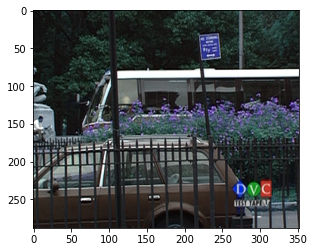

In [36]:
# display any random frame
plt.imshow(images[5])

In [37]:
len(images)
# We understand that there are 150 frames

150

### Horizontal Edge Detection

In [38]:
horizontal_mask = np.array([-1,-2,-1,0,0,0,1,2,1]).reshape(3,3) # Horizontal Mask
h_img = images.copy()

In [39]:
rows, cols,p = images[0].shape
print(rows,cols)

288 352


In [40]:
# Perform horizontal edge detection on frames 30 to 80

# Running over all the images
for i in range(30,80):
    # Running over every row in that image
    for row in range(1, rows-1):
        # Running over all the columns in that inamge
        for col in range(1, cols-1):
            # Perform Horizontal Edge Detection using mask mentioned before
            h_img[i][row][col] = np.multiply(images[i][row-1:row+2, col-1:col+2], horizontal_mask).sum()

In [41]:
# Writing the video as project.avi 
out = cv2.VideoWriter('project.avi', cv2.VideoWriter_fourcc(*'DIVX'), 30,(cols,rows))

# Here 30 is the frames / seconds (original frame rate)
# If we feed 60 - video becomes faster 
# If we feed 15 - video becomes slower

for i in range(len(h_img)):
    out.write(h_img[i])

out.release()

In [42]:
# Displaying the new clip
clip = VideoFileClip('project.avi')
clip.ipython_display()

 99%|█████████▉| 150/151 [00:00<00:00, 373.38it/s]


Text(0.5, 1.0, '35th Frame in Original Video')

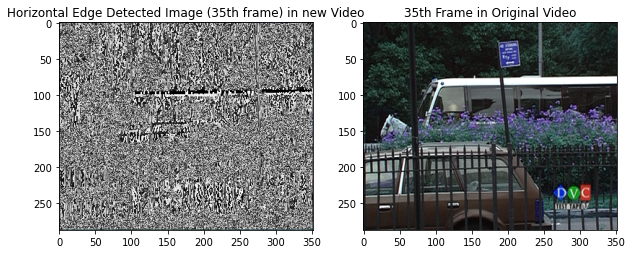

In [43]:
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.imshow(h_img[35])
plt.title("Horizontal Edge Detected Image (35th frame) in new Video")

plt.subplot(1,2,2)
plt.imshow(images[0])
plt.title("35th Frame in Original Video")

### Putting Text in Image

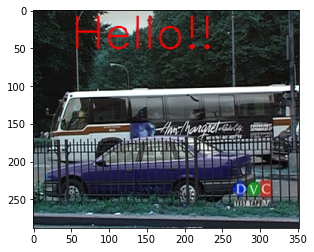

In [52]:
for i in range(90, 110):
    h_img[i] = cv2.putText(h_img[i] , text='Hello!!', org=(50,50), fontScale=2, color=(255,0,0), thickness=2, fontFace=cv2.FONT_HERSHEY_SIMPLEX)
plt.imshow(h_img[95], vmin=0,vmax=255)

### Blurring 

In [49]:
#Blur the frame number 120 to 150 
for i in range(120,150):
    # Create a smoothing/averaging mask
    kernel = np.ones((9,9),np.float32)/25 
    
    #Perform blurring
    h_img[i]= cv2.filter2D(h_img[i],-1,kernel) 


In [50]:
out = cv2.VideoWriter('/content/project2.avi',cv2.VideoWriter_fourcc(*'DIVX'), 15, (cols,rows))
for i in range(len(h_img)):
    out.write(h_img[i])
out.release()

In [51]:
#Play the video file using moviepy
from moviepy.editor import *
clip=VideoFileClip('/content/project2.avi')
clip.ipython_display()

 99%|█████████▉| 150/151 [00:00<00:00, 340.12it/s]


Text(0.5, 1.0, '135th Frame (Blurring)')

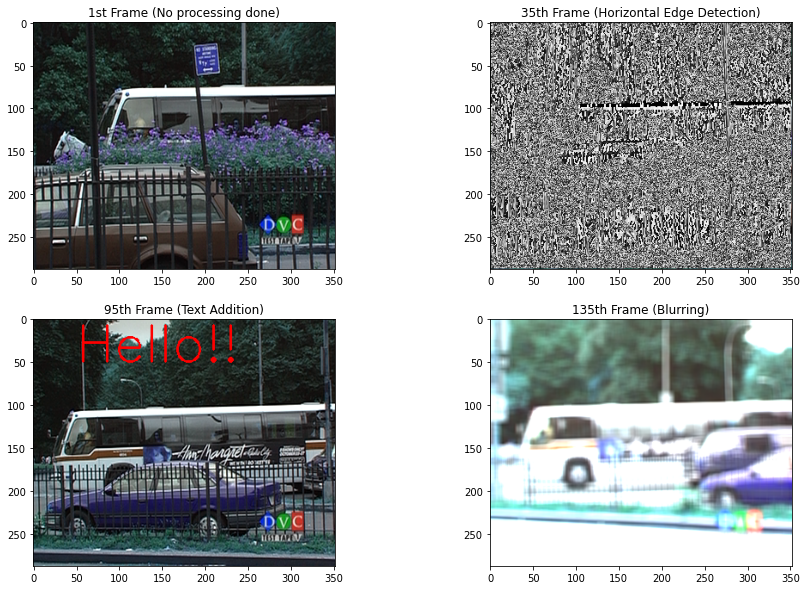

In [53]:
plt.figure(figsize=(15,10))

plt.subplot(2,2,1)
plt.imshow(h_img[0])
plt.title("1st Frame (No processing done)")

plt.subplot(2,2,2)
plt.imshow(h_img[35])
plt.title("35th Frame (Horizontal Edge Detection)")

plt.subplot(2,2,3)
plt.imshow(h_img[95])
plt.title("95th Frame (Text Addition)")

plt.subplot(2,2,4)
plt.imshow(h_img[135])
plt.title("135th Frame (Blurring)")

### Conclusion: 
After this experiment we were able to,

    1.	To read and play digital video.
    2.	Convert individual frame as image.
    3.	Apply techniques like blurring, text-addition, horizontal edge detection,etc. on videos

***(Video Added in src folder)***
